# Exploratory Data Aanalysis and Preprocessing

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
TRAIN_CSV = "train.csv"
TRAIN_IMAGE_DIR = "/content/drive/MyDrive/train_images"

In [ ]:
train_df = pd.read_csv(TRAIN_CSV)
train_df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,9117000170,20150505T000000,268643,4,2.25,1810,9240,2.0,0,0,...,7,1810,0,1961,0,98055,47.4362,-122.187,1660,9240
1,6700390210,20140708T000000,245000,3,2.50,1600,2788,2.0,0,0,...,7,1600,0,1992,0,98031,47.4034,-122.187,1720,3605
2,7212660540,20150115T000000,200000,4,2.50,1720,8638,2.0,0,0,...,8,1720,0,1994,0,98003,47.2704,-122.313,1870,7455
3,8562780200,20150427T000000,352499,2,2.25,1240,705,2.0,0,0,...,7,1150,90,2009,0,98027,47.5321,-122.073,1240,750
4,7760400350,20141205T000000,232000,3,2.00,1280,13356,1.0,0,0,...,7,1280,0,1994,0,98042,47.3715,-122.074,1590,8071


In [ ]:
train_df.isnull().sum()

,0
id,0
date,0
price,0
bedrooms,0
bathrooms,0
sqft_living,0
sqft_lot,0
floors,0
waterfront,0
view,0


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16209 entries, 0 to 16208
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             16209 non-null  int64  
 1   date           16209 non-null  object 
 2   price          16209 non-null  int64  
 3   bedrooms       16209 non-null  int64  
 4   bathrooms      16209 non-null  float64
 5   sqft_living    16209 non-null  int64  
 6   sqft_lot       16209 non-null  int64  
 7   floors         16209 non-null  float64
 8   waterfront     16209 non-null  int64  
 9   view           16209 non-null  int64  
 10  condition      16209 non-null  int64  
 11  grade          16209 non-null  int64  
 12  sqft_above     16209 non-null  int64  
 13  sqft_basement  16209 non-null  int64  
 14  yr_built       16209 non-null  int64  
 15  yr_renovated   16209 non-null  int64  
 16  zipcode        16209 non-null  int64  
 17  lat            16209 non-null  float64
 18  long  

##Tabular Data

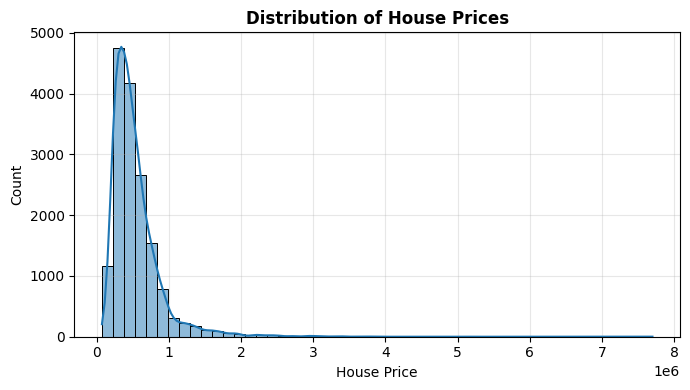

In [ ]:
plt.figure(figsize=(7, 4))
sns.histplot(
    train_df["price"],
    bins=50,
    kde=True
)
plt.title("Distribution of House Prices", fontsize=12, fontweight="bold")
plt.xlabel("House Price", fontsize=10)
plt.ylabel("Count", fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

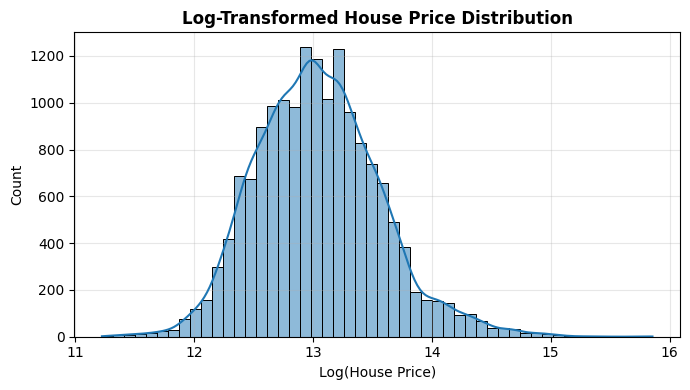

In [ ]:
plt.figure(figsize=(7, 4))
sns.histplot(
    np.log1p(train_df["price"]),
    bins=50,
    kde=True
)

plt.title("Log-Transformed House Price Distribution", fontsize=12, fontweight="bold")
plt.xlabel("Log(House Price)", fontsize=10)
plt.ylabel("Count", fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

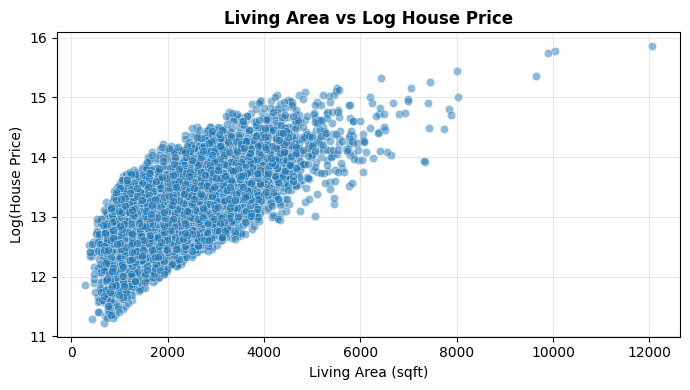

In [ ]:
plt.figure(figsize=(7, 4))
sns.scatterplot(
    x="sqft_living",
    y=np.log1p(train_df["price"]),
    data=train_df,
    alpha=0.5
)

plt.title("Living Area vs Log House Price", fontsize=12, fontweight="bold")
plt.xlabel("Living Area (sqft)")
plt.ylabel("Log(House Price)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

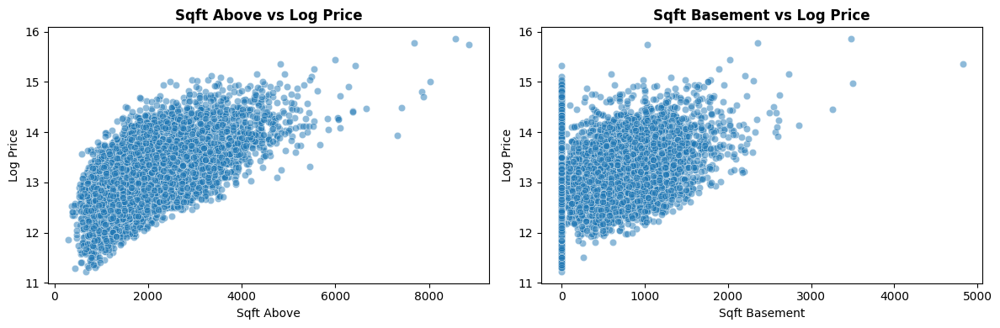

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12,4))

sns.scatterplot(
    x=train_df["sqft_above"],
    y=np.log1p(train_df["price"]),
    alpha=0.5,
    ax=axes[0]
)
axes[0].set_title("Sqft Above vs Log Price", fontsize=12, fontweight="bold")
axes[0].set_xlabel("Sqft Above")
axes[0].set_ylabel("Log Price")

sns.scatterplot(
    x=train_df["sqft_basement"],
    y=np.log1p(train_df["price"]),
    alpha=0.5,
    ax=axes[1]
)
axes[1].set_title("Sqft Basement vs Log Price", fontsize=12, fontweight="bold")
axes[1].set_xlabel("Sqft Basement")
axes[1].set_ylabel("Log Price")

plt.tight_layout()
plt.show()

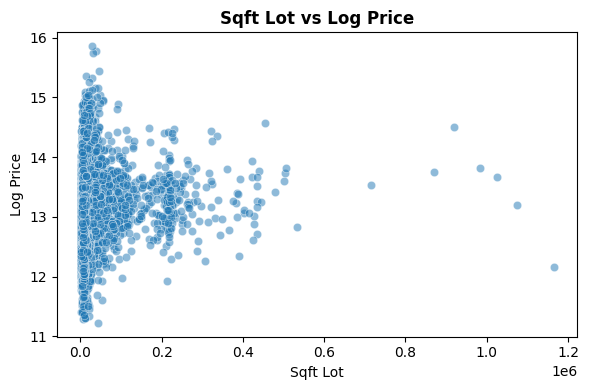

In [ ]:
plt.figure(figsize=(6,4))
sns.scatterplot(
    x=train_df["sqft_lot"],
    y=np.log1p(train_df["price"]),
    alpha=0.5
)
plt.title("Sqft Lot vs Log Price", fontsize=12, fontweight="bold")
plt.xlabel("Sqft Lot")
plt.ylabel("Log Price")
plt.tight_layout()
plt.show()

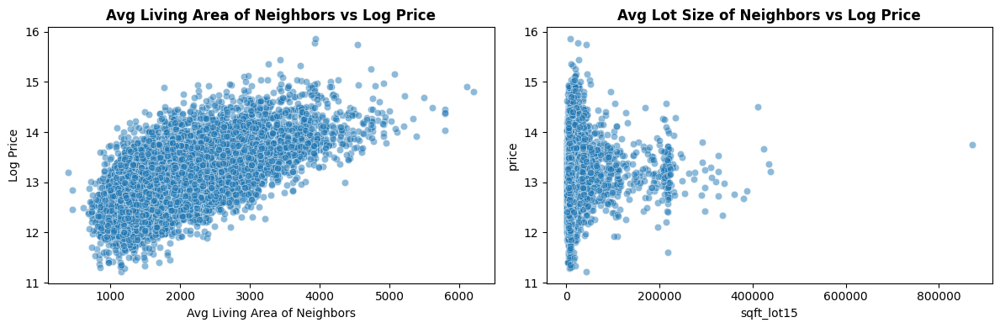

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12,4))

sns.scatterplot(
    x=train_df["sqft_living15"],
    y=np.log1p(train_df["price"]),
    alpha=0.5,
    ax=axes[0]
)
axes[0].set_title("Avg Living Area of Neighbors vs Log Price", fontsize=12, fontweight="bold")
axes[0].set_xlabel("Avg Living Area of Neighbors")
axes[0].set_ylabel("Log Price")

sns.scatterplot(
    x=train_df["sqft_lot15"],
    y=np.log1p(train_df["price"]),
    alpha=0.5,
    ax=axes[1]
)
axes[1].set_title("Avg Lot Size of Neighbors vs Log Price", fontsize=12, fontweight="bold")
axes

plt.tight_layout()
plt.show()

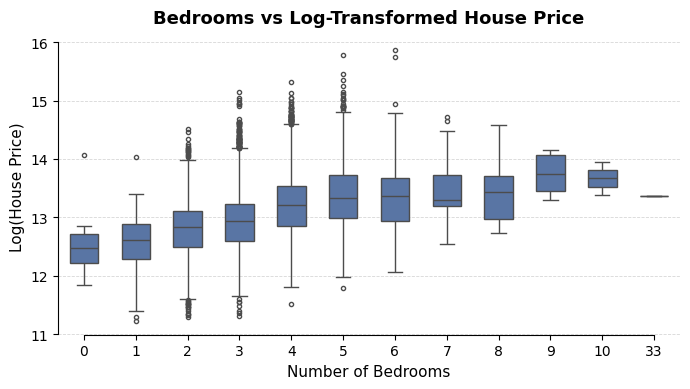

In [ ]:
plt.figure(figsize=(7, 4))

sns.boxplot(
    x="bedrooms",
    y=np.log1p(train_df["price"]),
    data=train_df,
    color="#4C72B0",
    width=0.55,
    fliersize=3,
    linewidth=1
)

plt.title(
    "Bedrooms vs Log-Transformed House Price",
    fontsize=13,
    fontweight="semibold",
    pad=10
)

plt.xlabel("Number of Bedrooms", fontsize=11)
plt.ylabel("Log(House Price)", fontsize=11)

plt.grid(axis="y", linestyle="--", linewidth=0.6, alpha=0.5)

sns.despine(trim=True)

plt.tight_layout()
plt.show()

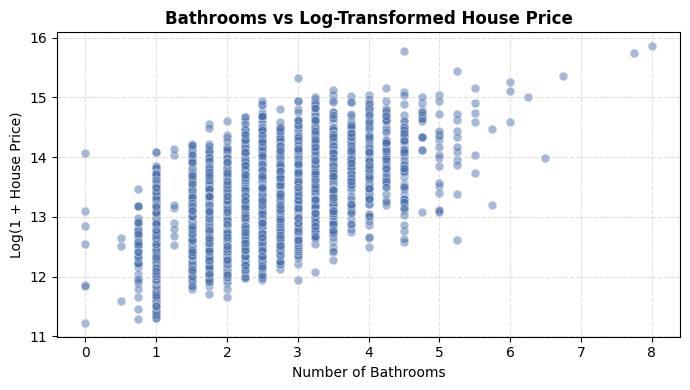

In [ ]:
plt.figure(figsize=(7, 4))

sns.scatterplot(
    x="bathrooms",
    y=np.log1p(train_df["price"]),
    data=train_df,
    color="#4C72B0",
    alpha=0.5,
    s=40
)

plt.title("Bathrooms vs Log-Transformed House Price", fontsize=12, fontweight="bold")
plt.xlabel("Number of Bathrooms", fontsize=10)
plt.ylabel("Log(1 + House Price)", fontsize=10)

plt.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

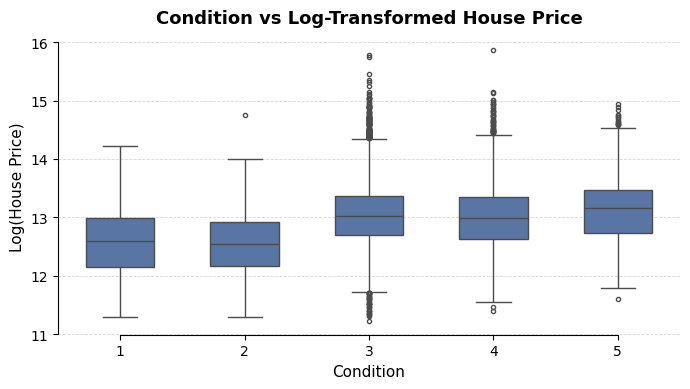

In [ ]:
plt.figure(figsize=(7, 4))

sns.boxplot(
    x="condition",
    y=np.log1p(train_df["price"]),
    data=train_df,
    color="#4C72B0",
    width=0.55,
    fliersize=3,
    linewidth=1
)

plt.title(
    "Condition vs Log-Transformed House Price",
    fontsize=13,
    fontweight="semibold",
    pad=10
)

plt.xlabel("Condition", fontsize=11)
plt.ylabel("Log(House Price)", fontsize=11)

plt.grid(axis="y", linestyle="--", linewidth=0.6, alpha=0.5)
sns.despine(trim=True)

plt.tight_layout()
plt.show()

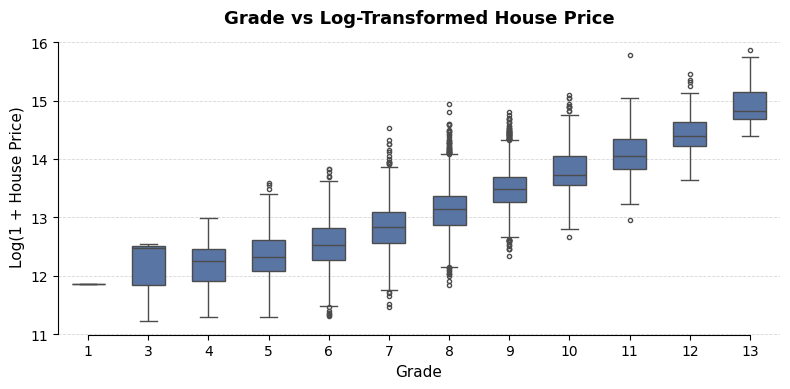

In [ ]:
plt.figure(figsize=(8, 4))

sns.boxplot(
    x="grade",
    y=np.log1p(train_df["price"]),
    data=train_df,
    color="#4C72B0",
    width=0.55,
    fliersize=3,
    linewidth=1
)

plt.title(
    "Grade vs Log-Transformed House Price",
    fontsize=13,
    fontweight="semibold",
    pad=10
)

plt.xlabel("Grade", fontsize=11)
plt.ylabel("Log(1 + House Price)", fontsize=11)

plt.grid(axis="y", linestyle="--", linewidth=0.6, alpha=0.5)
sns.despine(trim=True)

plt.tight_layout()
plt.show()

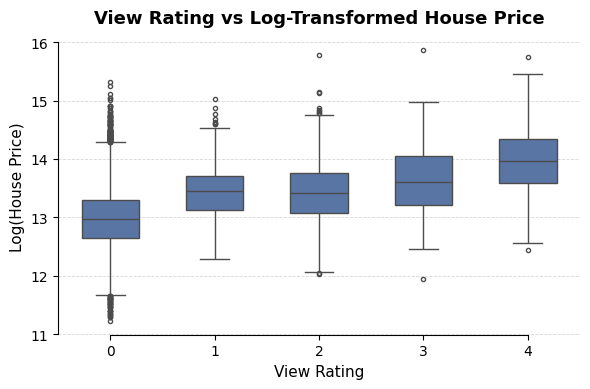

In [ ]:
plt.figure(figsize=(6, 4))

sns.boxplot(
    x="view",
    y=np.log1p(train_df["price"]),
    data=train_df,
    color="#4C72B0",
    width=0.55,
    fliersize=3,
    linewidth=1
)

plt.title(
    "View Rating vs Log-Transformed House Price",
    fontsize=13,
    fontweight="semibold",
    pad=10
)

plt.xlabel("View Rating", fontsize=11)
plt.ylabel("Log(House Price)", fontsize=11)

plt.grid(axis="y", linestyle="--", linewidth=0.6, alpha=0.5)
sns.despine(trim=True)

plt.tight_layout()
plt.show()

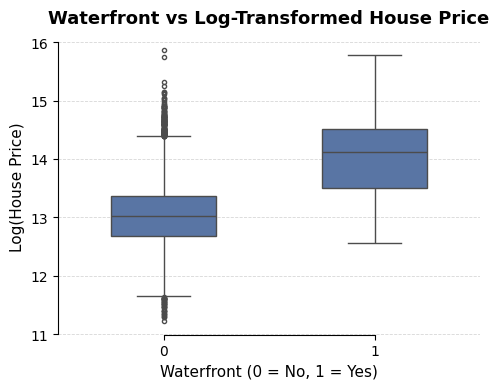

In [ ]:
plt.figure(figsize=(5, 4))

sns.boxplot(
    x="waterfront",
    y=np.log1p(train_df["price"]),
    data=train_df,
    color="#4C72B0",
    width=0.5,
    fliersize=3,
    linewidth=1
)

plt.title(
    "Waterfront vs Log-Transformed House Price",
    fontsize=13,
    fontweight="semibold",
    pad=10
)

plt.xlabel("Waterfront (0 = No, 1 = Yes)", fontsize=11)
plt.ylabel("Log(House Price)", fontsize=11)

plt.grid(axis="y", linestyle="--", linewidth=0.6, alpha=0.5)
sns.despine(trim=True)

plt.tight_layout()
plt.show()

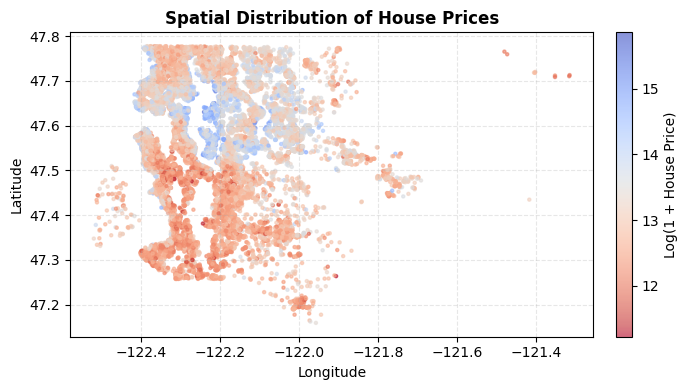

In [ ]:
plt.figure(figsize=(7, 4))

scatter = plt.scatter(
    train_df["long"],
    train_df["lat"],
    c=np.log1p(train_df["price"]),
    cmap="coolwarm_r",
    s=5,
    alpha=0.6
)

cbar = plt.colorbar(scatter, fraction=0.046, pad=0.04)
cbar.set_label("Log(1 + House Price)", fontsize=10)

plt.title("Spatial Distribution of House Prices", fontsize=12, fontweight="bold")
plt.xlabel("Longitude", fontsize=10)
plt.ylabel("Latitude", fontsize=10)
plt.grid(linestyle="--", alpha=0.3)

plt.tight_layout()
plt.show()

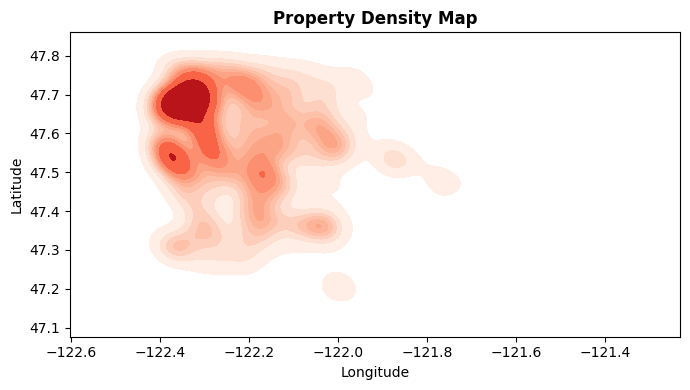

In [ ]:
plt.figure(figsize=(7, 4))
sns.kdeplot(
    x=train_df["long"],
    y=train_df["lat"],
    fill=True,
    cmap="Reds",
    thresh=0.05
)
plt.title("Property Density Map", fontsize=12, fontweight="bold")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()

In [ ]:
FEATURES = [
    "sqft_living", "sqft_above", "sqft_basement",
    "sqft_lot",
    "sqft_living15", "sqft_lot15",
    "condition", "grade",
    "view", "waterfront",
    "bedrooms", "bathrooms",
    "lat", "long"
]

corr_df = train_df[FEATURES].copy()
corr_df["log_price"] = np.log1p(train_df["price"])

corr_with_price = (
    corr_df
    .corr()["log_price"]
    .sort_values(ascending=False)
)

print(corr_with_price)

log_price        1.000000
grade            0.700249
sqft_living      0.693377
sqft_living15    0.615312
sqft_above       0.596904
bathrooms        0.550492
lat              0.452503
view             0.340868
bedrooms         0.337664
sqft_basement    0.315438
waterfront       0.161167
sqft_lot         0.098102
sqft_lot15       0.086677
long             0.052900
condition        0.033024
Name: log_price, dtype: float64


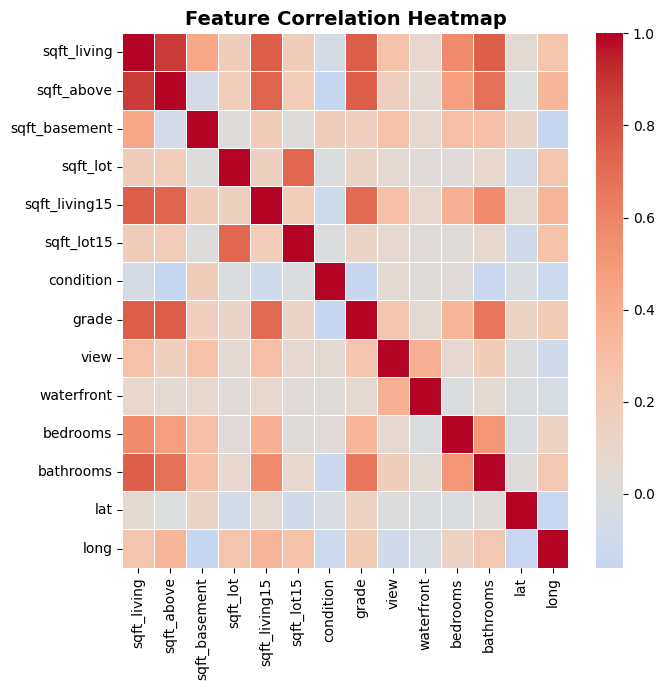

In [ ]:
plt.figure(figsize=(7, 7))
sns.heatmap(
    train_df[FEATURES].corr(),
    cmap="coolwarm",
    center=0,
    linewidths=0.5
)
plt.title("Feature Correlation Heatmap", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# Tabular-only Models

## Linear Regression and Random Forest Baseline

In [ ]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

In [ ]:
df = train_df

In [ ]:
TARGET = "price"

DROP_COLS = ["id", "date"]
X = df.drop(columns=[TARGET] + DROP_COLS)
y = np.log1p(df[TARGET])  # log(price)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [ ]:
lin_model = Pipeline([
    ("scaler", StandardScaler()),
    ("model", LinearRegression())
])

lin_model.fit(X_train, y_train)

y_pred = lin_model.predict(X_test)

print("Linear Regression Performance")
print("MAE:", mean_absolute_error(y_test, y_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("R2:", r2_score(y_test, y_pred))


Linear Regression Performance
MAE: 0.19234264187183864
RMSE: 0.24801585435658566
R2: 0.7770935269691468


In [ ]:
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=5,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)

print("Random Forest Performance")
print("MAE:", mean_absolute_error(y_test, y_pred_rf))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred_rf)))
print("R2:", r2_score(y_test, y_pred_rf))


Random Forest Performance
MAE: 0.1282465809474991
RMSE: 0.18195478242327515
R2: 0.8800250045225566


In [ ]:
feature_importance = pd.DataFrame({
    "feature": X.columns,
    "importance": rf.feature_importances_
}).sort_values(by="importance", ascending=False)

feature_importance.head(30)


,feature,importance
8,grade,0.350506
14,lat,0.307628
2,sqft_living,0.189994
15,long,0.042970
16,sqft_living15,0.023277
11,yr_built,0.018359
9,sqft_above,0.012931
3,sqft_lot,0.012459
17,sqft_lot15,0.010777
13,zipcode,0.010039


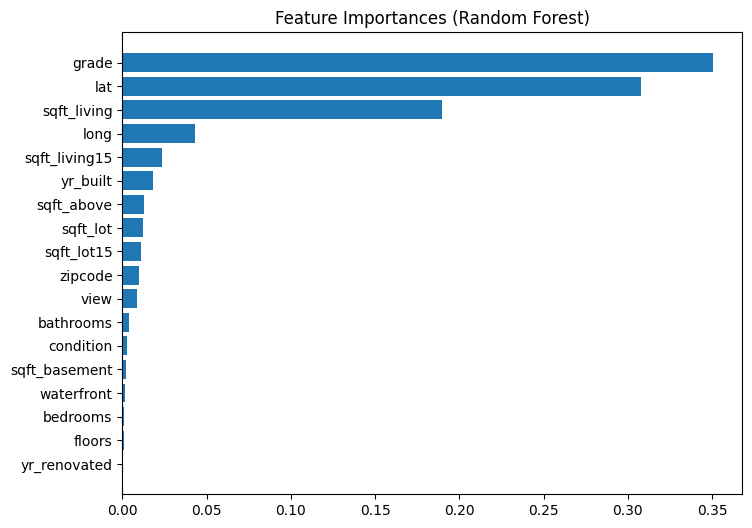

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
plt.barh(
    feature_importance["feature"][:20][::-1],
    feature_importance["importance"][:20][::-1]
)
plt.title("Feature Importances (Random Forest)")
plt.show()


## Catboost to leverage ordinal features

In [ ]:
!pip install catboost --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.6 MB/s eta 0:00:00


In [ ]:
df = pd.read_csv('train.csv')

In [ ]:
df["renovated_post_2000"] = np.where(
    df["yr_renovated"] > 0,
    "yes",
    "no"
)


In [ ]:
df.drop(columns=["yr_renovated"], inplace=True)

In [ ]:
CAT_COLS = [
    "view",
    "condition",
    "waterfront",
    "floors",
    "renovated_post_2000",

]

for col in CAT_COLS:
    df[col] = df[col].astype(str)


In [ ]:
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

In [ ]:
TARGET = "price"
DROP_COLS = ["id", "date"]

X = df.drop(columns=[TARGET] + DROP_COLS)
y = np.log1p(df[TARGET])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)


In [ ]:
cat_features = CAT_COLS

In [ ]:
from catboost import CatBoostRegressor

cat_model = CatBoostRegressor(
    iterations=1500,
    depth=8,
    learning_rate=0.05,
    loss_function="RMSE",
    random_seed=42,
    verbose=200
)

cat_model.fit(
    X_train,
    y_train,
    cat_features=CAT_COLS,
    eval_set=(X_test, y_test),
    use_best_model=True
)


0:	learn: 0.5049103	test: 0.5067194	best: 0.5067194 (0)	total: 30.8ms	remaining: 46.2s
200:	learn: 0.1577559	test: 0.1694064	best: 0.1694064 (200)	total: 5.51s	remaining: 35.6s
400:	learn: 0.1403344	test: 0.1631736	best: 0.1631720 (399)	total: 12.9s	remaining: 35.2s
600:	learn: 0.1296163	test: 0.1616623	best: 0.1616502 (579)	total: 18.3s	remaining: 27.4s
800:	learn: 0.1218551	test: 0.1612583	best: 0.1612236 (782)	total: 25.8s	remaining: 22.5s
1000:	learn: 0.1151201	test: 0.1609116	best: 0.1608812 (939)	total: 31.3s	remaining: 15.6s
1200:	learn: 0.1091065	test: 0.1607081	best: 0.1606962 (1178)	total: 39.1s	remaining: 9.73s
1400:	learn: 0.1039132	test: 0.1610360	best: 0.1606763 (1215)	total: 44.7s	remaining: 3.16s
1499:	learn: 0.1015701	test: 0.1610842	best: 0.1606763 (1215)	total: 47.3s	remaining: 0us

bestTest = 0.1606762985
bestIteration = 1215

Shrink model to first 1216 iterations.


In [ ]:
y_pred = cat_model.predict(X_test)

print("CatBoost Performance")
print("MAE:", mean_absolute_error(y_test, y_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("R2:", r2_score(y_test, y_pred))


CatBoost Performance
MAE: 0.11505996056406516
RMSE: 0.16067629368861616
R2: 0.9064449138306332


In [ ]:
feature_importance = pd.DataFrame({
    "feature": X_train.columns,
    "importance": cat_model.get_feature_importance()
}).sort_values("importance", ascending=False)

feature_importance.head(20)


,feature,importance
13,lat,36.605636
2,sqft_living,13.924791
12,zipcode,9.739949
8,grade,9.311261
14,long,7.594771
11,yr_built,3.550162
15,sqft_living15,3.197450
3,sqft_lot,3.085103
6,view,3.046092
9,sqft_above,2.784908


In [ ]:
TOP_5 = [
    "lat",
    "sqft_living",
    "zipcode",
    "grade",
    "long"
]

In [ ]:
TOP_10 = [
    "lat",
    "sqft_living",
    "zipcode",
    "grade",
    "long",
    "yr_built",
    "sqft_living15",
    "sqft_lot",
    "view",
    "sqft_above"
]

In [ ]:
TOP_15 = [
    "lat",
    "sqft_living",
    "zipcode",
    "grade",
    "long",
    "yr_built",
    "sqft_living15",
    "sqft_lot",
    "view",
    "sqft_above",
    "bathrooms",
    "sqft_lot15",
    "condition",
    "waterfront",
    "sqft_basement"
]

In [ ]:
from catboost import CatBoostRegressor
from sklearn.metrics import r2_score, mean_absolute_error

In [ ]:
def train_catboost_subset(features):
    X_sub = X[features]

    X_train_sub, X_test_sub, y_train_sub, y_test_sub = train_test_split(
        X_sub, y, test_size=0.2, random_state=42
    )

    cat_features_sub = [f for f in features if f in CAT_COLS]

    model = CatBoostRegressor(
        iterations=800,
        depth=8,
        learning_rate=0.05,
        loss_function="RMSE",
        random_seed=42,
        verbose=False
    )

    model.fit(
        X_train_sub,
        y_train_sub,
        cat_features=cat_features_sub,
        eval_set=(X_test_sub, y_test_sub),
        use_best_model=True
    )

    preds = model.predict(X_test_sub)

    return {
        "R2": r2_score(y_test_sub, preds),
        "MAE": mean_absolute_error(y_test_sub, preds)
    }


In [ ]:
results = pd.DataFrame.from_dict({
    "Top 5": train_catboost_subset(TOP_5),
    "Top 10": train_catboost_subset(TOP_10),
    "Top 15": train_catboost_subset(TOP_15),
    "All Features": train_catboost_subset(X.columns.tolist())
}, orient="index")

results


,R2,MAE
Top 5,0.874197,0.132206
Top 10,0.896597,0.121412
Top 15,0.904432,0.116057
All Features,0.906340,0.115146


## Testing Autogluon Ensemble

In [ ]:
!pip install autogluon --q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.6/227.6 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 452.1/452.1 kB 32.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.2/515.2 kB 38.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.8/244.8 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.4/74.4 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 kB 15.3 MB/s eta 0:0

In [ ]:
import torch
torch.cuda.is_available()

True

In [ ]:
from autogluon.tabular import TabularPredictor
import pandas as pd

df = pd.read_csv('train.csv')
train_data = df.copy()
label = "price"

In [ ]:
predictor = TabularPredictor(
    label=label,
    problem_type="regression",
    eval_metric="r2"
).fit(
    train_data,
    presets="best_quality",
    time_limit=1800,     # 1 hour (adjustable)
    num_gpus=1
)


No path specified. Models will be saved in: "AutogluonModels/ag-20260103_130348"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.5.0
Python Version:     3.12.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP Thu Oct  2 10:42:05 UTC 2025
CPU Count:          2
Pytorch Version:    2.9.0+cu126
CUDA Version:       12.6
GPU Memory:         GPU 0: 14.74/14.74 GB
Total GPU Memory:   Free: 14.74 GB, Allocated: 0.00 GB, Total: 14.74 GB
GPU Count:          1
Memory Avail:       10.20 GB / 12.67 GB (80.5%)
Disk Space Avail:   73.24 GB / 112.64 GB (65.0%)
Presets specified: ['best_quality']
Using hyperparameters preset: hyperparameters='zeroshot'
Setting dynamic_stacking from 'auto' to True. Reason: Enable dynamic_stacking when use_bag_holdout is disabled. (use_bag_holdout=False)
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
DyStack is enabled (dynamic_stacking=Tru

In [ ]:
predictor.leaderboard()

,model,score_val,eval_metric,pred_time_val,fit_time,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L3,0.913702,r2,18.761714,1007.944478,0.001484,0.241057,3,True,13
1,ExtraTreesMSE_BAG_L2,0.911485,r2,17.238645,854.085184,1.018132,32.834004,2,True,12
2,WeightedEnsemble_L2,0.911439,r2,13.955526,722.350292,0.001569,0.199283,2,True,7
3,RandomForestMSE_BAG_L2,0.909820,r2,17.742099,974.869417,1.521585,153.618237,2,True,10
4,CatBoost_BAG_L1,0.903355,r2,0.142735,398.760576,0.142735,398.760576,1,True,4
5,CatBoost_BAG_L2,0.897609,r2,16.266772,879.316043,0.046259,58.064863,2,True,11
6,LightGBMXT_BAG_L1,0.897489,r2,7.077115,107.736027,7.077115,107.736027,1,True,1
7,LightGBM_BAG_L1,0.897153,r2,6.048780,88.221046,6.048780,88.221046,1,True,2
8,LightGBM_BAG_L2,0.895390,r2,17.899453,882.986238,1.678940,61.735059,2,True,9
9,NeuralNetFastAI_BAG_L1,0.894054,r2,0.685327,127.433360,0.685327,127.433360,1,True,6


## Testing LightGBM + Optuna

In [ ]:
import lightgbm as lgb
import optuna
import numpy as np  # <--- Added numpy for sqrt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import pandas as pd

# ... (Previous data loading code remains the same) ...
# TARGET = "price"
# cols_to_drop = [TARGET, "id", "date"]
# X = df.drop(columns=cols_to_drop, errors='ignore')
# y = df[TARGET]
# ...

def objective(trial):
    params = {
        "objective": "regression",
        "metric": "rmse",
        "boosting_type": "gbdt",
        "device": "gpu",
        "gpu_platform_id": 0,
        "gpu_device_id": 0,
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 31, 256),
        "max_depth": trial.suggest_int("max_depth", 4, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 20, 200),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.6, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.6, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 10),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 5.0),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 5.0),
        "verbosity": -1,
        "seed": 42
    }

    train_set = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_cols, free_raw_data=False)
    valid_set = lgb.Dataset(X_test, label=y_test, categorical_feature=categorical_cols, free_raw_data=False)

    model = lgb.train(
        params,
        train_set,
        valid_sets=[valid_set],
        num_boost_round=5000,
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
            lgb.log_evaluation(0)
        ]
    )

    preds = model.predict(X_test)

    # 🔥 FIXED LINE: Calculate MSE first, then sqrt for RMSE
    mse = mean_squared_error(y_test, preds)
    rmse = np.sqrt(mse)

    return rmse

# Run Optimization
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

print(f"Best RMSE: {study.best_value}")
print(f"Best Params: {study.best_params}")

In [ ]:
from sklearn.metrics import r2_score

# 1. Get the best hyperparameters from the study
best_params = study.best_params

# 2. Add the fixed parameters that weren't optimized
best_params.update({
    "objective": "regression",
    "metric": "rmse",
    "boosting_type": "gbdt",
    "device": "gpu",
    "gpu_platform_id": 0,
    "gpu_device_id": 0,
    "verbosity": -1,
    "seed": 42
})

# 3. Retrain on the full training set
train_set = lgb.Dataset(
    X_train,
    label=y_train,
    categorical_feature=categorical_cols,
    free_raw_data=False
)

valid_set = lgb.Dataset(
    X_test,
    label=y_test,
    categorical_feature=categorical_cols,
    free_raw_data=False
)

best_model = lgb.train(
    best_params,
    train_set,
    valid_sets=[valid_set],
    num_boost_round=5000,
    callbacks=[
        lgb.early_stopping(stopping_rounds=100),
        lgb.log_evaluation(100) # Print progress every 100 rounds
    ]
)

# 4. Predict and Calculate R2
preds = best_model.predict(X_test)

final_r2 = r2_score(y_test, preds)
final_rmse = np.sqrt(mean_squared_error(y_test, preds))

print("-" * 30)
print(f"Final RMSE: {final_rmse:,.4f}")
print(f"Final R² Score: {final_r2:.4f}")
print("-" * 30)

Training until validation scores don't improve for 100 rounds
[100]	valid_0's rmse: 119990
[200]	valid_0's rmse: 115461
[300]	valid_0's rmse: 114393
[400]	valid_0's rmse: 113953
[500]	valid_0's rmse: 113716
[600]	valid_0's rmse: 113664
[700]	valid_0's rmse: 113406
[800]	valid_0's rmse: 113393
Early stopping, best iteration is:
[767]	valid_0's rmse: 113317
------------------------------
Final RMSE: 113,316.7064
Final R² Score: 0.8977
------------------------------


## Final Best Model Catboost using all features

In [ ]:
import optuna
import numpy as np
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Ensure CAT_COLS is defined (using your variable from previous steps)
# If you used 'categorical_cols' before, just assign it:
# CAT_COLS = categorical_cols

def objective(trial):
    params = {
        "iterations": 2000, # High number, early stopping will limit it
        "loss_function": "RMSE",
        "random_seed": 42,
        "verbose": False,

        # 🔥 GPU SETTINGS (Remove if not using GPU)
        "task_type": "GPU",
        "devices": "0",

        # HYPERPARAMETERS TO TUNE
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "depth": trial.suggest_int("depth", 4, 10),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1, 10),
        "random_strength": trial.suggest_float("random_strength", 0.0, 10.0),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 1.0),
        "border_count": trial.suggest_int("border_count", 32, 255),
    }

    model = CatBoostRegressor(**params)

    model.fit(
        X_train,
        y_train,
        cat_features=CAT_COLS,
        eval_set=(X_test, y_test),
        early_stopping_rounds=100,
        verbose=False
    )

    preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))

    return rmse

# 1. Run Optimization
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=20) # CatBoost is slower, so start with fewer trials

print("------------------------------------------------")
print(f"Best RMSE: {study.best_value}")
print(f"Best Params: {study.best_params}")
print("------------------------------------------------")

# 2. Retrain with Best Params & Calculate R2
best_params = study.best_params
best_params.update({
    "iterations": 2000,
    "loss_function": "RMSE",
    "random_seed": 42,
    "task_type": "GPU", # Keep consistent with training
    "devices": "0",
    "verbose": 200
})

final_model = CatBoostRegressor(**best_params)

final_model.fit(
    X_train,
    y_train,
    cat_features=CAT_COLS,
    eval_set=(X_test, y_test),
    early_stopping_rounds=100,
    use_best_model=True
)

final_preds = final_model.predict(X_test)
final_r2 = r2_score(y_test, final_preds)

print(f"Final R² Score: {final_r2:.4f}")

[I 2026-01-03 14:33:39,514] A new study created in memory with name: no-name-6b13a5ea-003b-43df-b482-83ac9dec718c
[I 2026-01-03 14:34:02,831] Trial 0 finished with value: 0.1646153378592771 and parameters: {'learning_rate': 0.09650892496976449, 'depth': 7, 'l2_leaf_reg': 5.728316465531256, 'random_strength': 3.2245021178861233, 'bagging_temperature': 0.36542347766036787, 'border_count': 105}. Best is trial 0 with value: 0.1646153378592771.
[I 2026-01-03 14:34:39,704] Trial 1 finished with value: 0.16446956417144334 and parameters: {'learning_rate': 0.1527217328870944, 'depth': 10, 'l2_leaf_reg': 4.210928195473288, 'random_strength': 2.374895421162009, 'bagging_temperature': 0.21728117320197393, 'border_count': 143}. Best is trial 1 with value: 0.16446956417144334.
[I 2026-01-03 14:35:18,273] Trial 2 finished with value: 0.1632739561336014 and parameters: {'learning_rate': 0.060114439768257685, 'depth': 5, 'l2_leaf_reg': 9.792613138778071, 'random_strength': 1.0177567574794344, 'bagging

------------------------------------------------
Best RMSE: 0.16313767345832103
Best Params: {'learning_rate': 0.07079791420185165, 'depth': 6, 'l2_leaf_reg': 7.742266703947923, 'random_strength': 0.4408831337055501, 'bagging_temperature': 0.7798134331293824, 'border_count': 109}
------------------------------------------------
0:	learn: 0.4977416	test: 0.4993591	best: 0.4993591 (0)	total: 33.6ms	remaining: 1m 7s
200:	learn: 0.1736114	test: 0.1786330	best: 0.1786158 (198)	total: 5.17s	remaining: 46.3s
400:	learn: 0.1611728	test: 0.1691030	best: 0.1691030 (400)	total: 8.98s	remaining: 35.8s
600:	learn: 0.1548701	test: 0.1656395	best: 0.1656366 (599)	total: 13.9s	remaining: 32.4s
800:	learn: 0.1500261	test: 0.1638830	best: 0.1638830 (800)	total: 19.2s	remaining: 28.7s
1000:	learn: 0.1468591	test: 0.1631524	best: 0.1631379 (990)	total: 23.1s	remaining: 23.1s
1200:	learn: 0.1445614	test: 0.1628406	best: 0.1627988 (1178)	total: 29.8s	remaining: 19.8s
1400:	learn: 0.1433004	test: 0.1626227	b

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

df = pd.read_csv('train.csv')
df["renovated_post_2000"] = np.where(
df["yr_renovated"] > 0,
"yes",
"no"
)

df.drop(columns=["yr_renovated"], inplace=True)

CAT_COLS = [
"view",
"condition",
"waterfront",
"floors",
"renovated_post_2000",

]

for col in CAT_COLS:
  df[col] = df[col].astype(str)

TARGET = "price"
DROP_COLS = ["id", "date"]

X = df.drop(columns=[TARGET] + DROP_COLS)
y = np.log1p(df[TARGET])

X_train, X_test, y_train, y_test = train_test_split(
X, y, test_size=0.2, random_state=42
)

cat_features = CAT_COLS

from catboost import CatBoostRegressor

cat_model = CatBoostRegressor(
iterations=1500,
depth=8,
learning_rate=0.05,
loss_function="RMSE",
random_seed=42,
verbose=200
)

cat_model.fit(
X_train,
y_train,
cat_features=CAT_COLS,
eval_set=(X_test, y_test),
use_best_model=True
)


0:	learn: 0.5049103	test: 0.5067194	best: 0.5067194 (0)	total: 74.3ms	remaining: 1m 51s
200:	learn: 0.1577559	test: 0.1694064	best: 0.1694064 (200)	total: 5.75s	remaining: 37.2s
400:	learn: 0.1403344	test: 0.1631736	best: 0.1631720 (399)	total: 9.91s	remaining: 27.2s
600:	learn: 0.1296163	test: 0.1616623	best: 0.1616502 (579)	total: 15.9s	remaining: 23.8s
800:	learn: 0.1218551	test: 0.1612583	best: 0.1612236 (782)	total: 20.2s	remaining: 17.6s
1000:	learn: 0.1151201	test: 0.1609116	best: 0.1608812 (939)	total: 24.5s	remaining: 12.2s
1200:	learn: 0.1091065	test: 0.1607081	best: 0.1606962 (1178)	total: 30.6s	remaining: 7.63s
1400:	learn: 0.1039132	test: 0.1610360	best: 0.1606763 (1215)	total: 35.1s	remaining: 2.48s
1499:	learn: 0.1015701	test: 0.1610842	best: 0.1606763 (1215)	total: 37.2s	remaining: 0us

bestTest = 0.1606762985
bestIteration = 1215

Shrink model to first 1216 iterations.


In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

y_pred = cat_model.predict(X_test)

print("CatBoost Performance")
print("MAE:", mean_absolute_error(y_test, y_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("R2:", r2_score(y_test, y_pred))

CatBoost Performance
MAE: 0.11505996056406516
RMSE: 0.16067629368861616
R2: 0.9064449138306332


# Extracting Feature Embeddings from Visual Data + GradCAM

### Approach 1

In [ ]:
from google.colab import drive
drive._mount('/content/drive')

In [ ]:
import torch
import torch.nn as nn
import timm

class ConvNeXtFeatureExtractor(nn.Module):
    def __init__(self, model_name="convnext_tiny", pretrained=True):
        super().__init__()
        self.backbone = timm.create_model(
            model_name,
            pretrained=pretrained,
            num_classes=0,      # removes classification head
            global_pool="avg"   # global average pooling
        )

    def forward(self, x):
        return self.backbone(x)  # (B, 768)


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model = ConvNeXtFeatureExtractor().to(device)
model.eval()   # important for feature extraction


ConvNeXtFeatureExtractor(
  (backbone): ConvNeXt(
    (stem): Sequential(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((96,), eps=1e-06, elementwise_affine=True)
    )
    (stages): Sequential(
      (0): ConvNeXtStage(
        (downsample): Identity()
        (blocks): Sequential(
          (0): ConvNeXtBlock(
            (conv_dw): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
            (norm): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
            (mlp): Mlp(
              (fc1): Linear(in_features=96, out_features=384, bias=True)
              (act): GELU()
              (drop1): Dropout(p=0.0, inplace=False)
              (norm): Identity()
              (fc2): Linear(in_features=384, out_features=96, bias=True)
              (drop2): Dropout(p=0.0, inplace=False)
            )
            (shortcut): Identity()
            (drop_path): Identity()
          )
          (1): ConvNeXtBlock(
            

In [ ]:
from torchvision import transforms
from PIL import Image

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

def load_image(path):
    img = Image.open(path).convert("RGB")
    return transform(img)


In [ ]:
from torch.utils.data import Dataset, DataLoader
import os

class ImageDataset(Dataset):
    def __init__(self, image_paths):
        self.image_paths = image_paths

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = load_image(self.image_paths[idx])
        return img, self.image_paths[idx]


In [ ]:
import numpy as np

def extract_features(model, dataloader):
    features = {}
    with torch.no_grad():
        for imgs, paths in dataloader:
            imgs = imgs.to(device)
            emb = model(imgs)  # (B, 768)

            for e, p in zip(emb.cpu().numpy(), paths):
                features[os.path.basename(p)] = e

    return features


In [ ]:
import os
import re

def get_zoom17_images(image_dir):
    """
    Returns sorted list of (row_id, image_path) for zoom-17 images
    """
    pattern = re.compile(r"(\d+)_z17\.png$")
    items = []

    for fname in os.listdir(image_dir):
        match = pattern.match(fname)
        if match:
            row_id = int(match.group(1))
            path = os.path.join(image_dir, fname)
            items.append((row_id, path))

    # sort by row_id to align with tabular data
    items.sort(key=lambda x: x[0])
    return items


In [ ]:
from torch.utils.data import Dataset
from PIL import Image

class Zoom17Dataset(Dataset):
    def __init__(self, image_dir, transform):
        self.items = get_zoom17_images(image_dir)
        self.transform = transform

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        row_id, path = self.items[idx]
        img = Image.open(path).convert("RGB")
        img = self.transform(img)
        return img, row_id


In [ ]:
from torch.utils.data import DataLoader

image_dir = "/content/drive/MyDrive/train_images"  # folder with 0_z16.png, 0_z17.png, etc.

dataset = Zoom17Dataset(image_dir, transform)
loader = DataLoader(
    dataset,
    batch_size=32,
    shuffle=False,   # IMPORTANT for row alignment
    num_workers=4
)


In [ ]:
from tqdm import tqdm
import torch

def extract_features(model, dataloader, device):
    model.eval()
    features = {}

    with torch.no_grad():
        for imgs, row_ids in tqdm(
            dataloader,
            desc="Extracting ConvNeXt-Z17 features",
            total=len(dataloader)
        ):
            imgs = imgs.to(device)
            emb = model(imgs)  # (B, 768)

            for e, rid in zip(emb.cpu().numpy(), row_ids):
                features[int(rid)] = e

    return features


In [ ]:
# Extract
features_dict = extract_features(model, loader, device)

# Convert to matrix ordered by row_id
row_ids_sorted = sorted(features_dict.keys())
X_img = np.vstack([features_dict[rid] for rid in row_ids_sorted])

print(X_img.shape)  # (N, 768)


Extracting ConvNeXt-Z17 features: 100%|██████████| 507/507 [01:48<00:00,  4.69it/s]


(16209, 768)


In [ ]:
import numpy as np

# Save as binary file (.npy)
np.save('image_embeddings.npy', X_img)

# Save the sorted row_ids as well to keep track of which row is which
np.save('row_ids.npy', np.array(row_ids_sorted))

# To load them back:
# X_img = np.load('image_embeddings.npy')

In [ ]:
import pandas as pd
import numpy as np

# 1. Create column names for the 768 dimensions
embedding_cols = [f'emb_{i}' for i in range(X_img.shape[1])]

# 2. Create the DataFrame
# We combine the sorted row_ids and the embedding matrix
df = pd.DataFrame(X_img, columns=embedding_cols)
df.insert(0, 'row_id', row_ids_sorted)

# 3. Save to CSV
# index=False prevents pandas from adding an extra unnamed column for the row index
df.to_csv('embeddings.csv', index=False)

In [ ]:
target_layer =  model.backbone.stages[-1]

In [ ]:
import cv2

#### Gradcam

In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, input_tensor):
        self.model.zero_grad()
        output = self.model(input_tensor)

        # Regression-safe scalar
        score = output.mean()
        score.backward()

        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * self.activations).sum(dim=1)
        cam = torch.relu(cam)

        cam = cam.squeeze().detach().cpu().numpy()
        cam = cv2.resize(cam, (224, 224))
        cam = (cam - cam.min()) / (cam.max() + 1e-8)
        return cam


In [ ]:
import matplotlib.pyplot as plt

def show_cam(image_path, cam):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    overlay = 0.4 * heatmap + img

    plt.figure(figsize=(5,5))
    plt.imshow(overlay.astype(np.uint8))
    plt.axis("off")
    plt.show()


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_cam(image_path, cam):
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image not found: {image_path}")

    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"cv2.imread failed for: {image_path}")

    img = cv2.resize(img, (224, 224))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    heatmap = cv2.applyColorMap(
        np.uint8(255 * cam),
        cv2.COLORMAP_JET
    )

    overlay = (0.4 * heatmap + img).astype(np.uint8)

    plt.figure(figsize=(5, 5))
    plt.imshow(overlay)
    plt.axis("off")
    plt.show()



--- Visualizing Top 5 Most Expensive ---
ID: 4962 | Price: 7700000


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1866: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


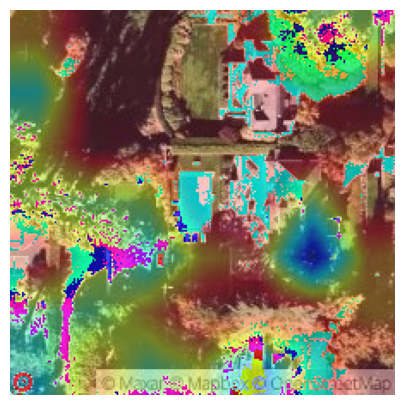

ID: 1499 | Price: 7062500


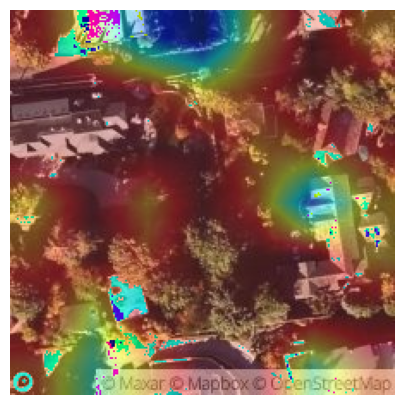

ID: 2115 | Price: 6885000


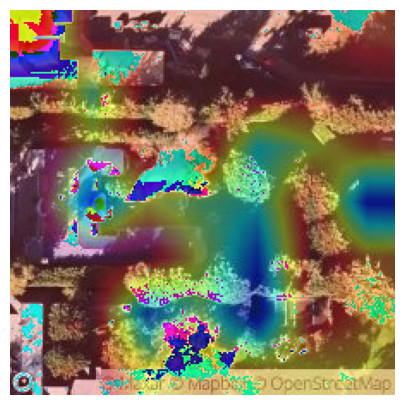

ID: 9264 | Price: 5110800


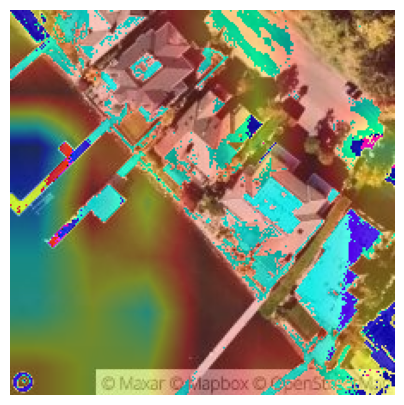

ID: 10412 | Price: 4668000


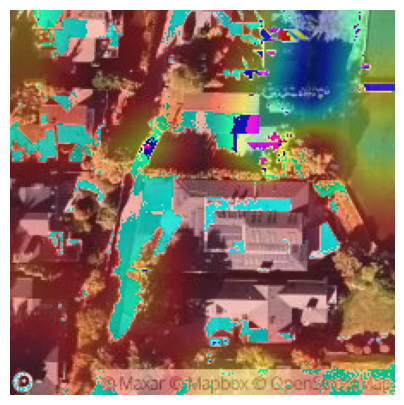


--- Visualizing Top 5 Cheapest ---
ID: 3656 | Price: 75000


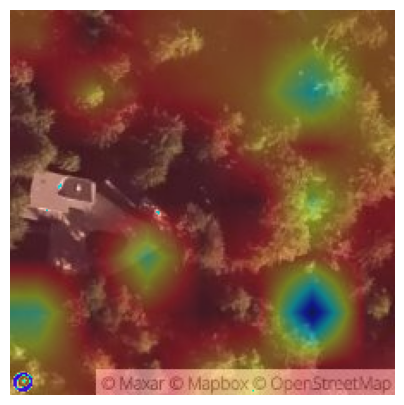

ID: 3789 | Price: 80000


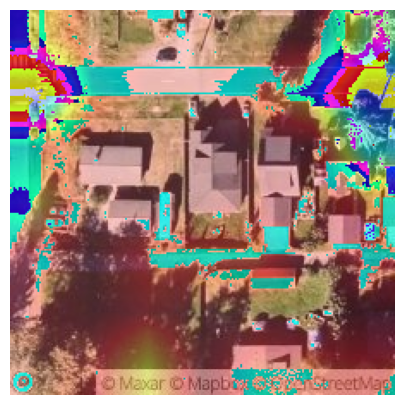

ID: 16074 | Price: 81000


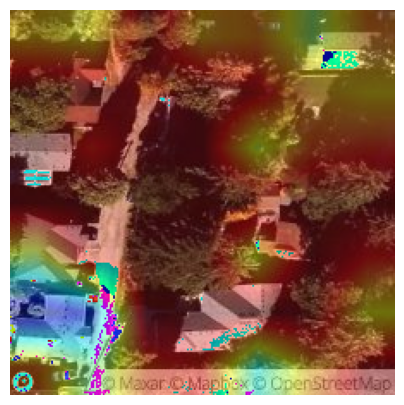

ID: 10552 | Price: 82000


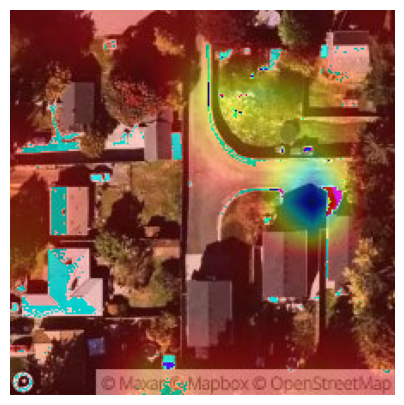

ID: 10246 | Price: 84000


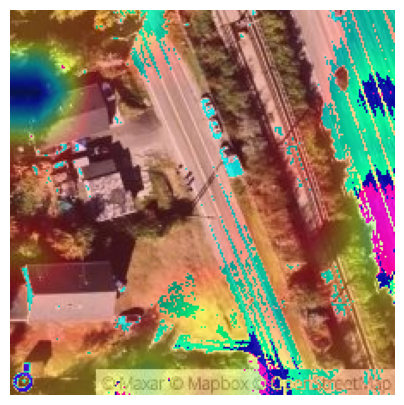

In [ ]:
import torch
from matplotlib import pyplot as plt

# 1. Identify target dataframes
top_expensive = df.nlargest(5, 'price')
top_cheapest = df.nsmallest(5, 'price')

# 2. Combine targets to iterate
targets = [("Most Expensive", top_expensive), ("Cheapest", top_cheapest)]

# 3. Initialize GradCAM
gradcam = GradCAM(model, target_layer)

for label, subset in targets:
    print(f"\n--- Visualizing Top 5 {label} ---")
    for _, row in subset.iterrows():
        # Construct path using row_number
        row_id = int(row['row_number'])
        img_path = f"/content/drive/MyDrive/train_images/{row_id}_z17.png"

        try:
            # Load, unsqueeze, and move to device
            img_t = load_image(img_path).unsqueeze(0).to(device)

            # Generate CAM
            cam = gradcam.generate(img_t)

            # Display
            print(f"ID: {row_id} | Price: {row['price']}")
            show_cam(img_path, cam)
            plt.show()

        except Exception as e:
            print(f"Could not process image for row {row_id}: {e}")

### Approach 2

In [ ]:
import os
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from tqdm import tqdm
import timm
from sklearn.model_selection import train_test_split


In [ ]:
df = pd.read_csv('train.csv')
df = df[['id', 'price']]
df["row_number"] = df.index

In [ ]:
df.head()

,id,price,row_number
0,9117000170,268643,0
1,6700390210,245000,1
2,7212660540,200000,2
3,8562780200,352499,3
4,7760400350,232000,4


In [ ]:
train_df, val_df = train_test_split(
    df,
    test_size=0.2,       # 80 / 20 split
    random_state=42      # reproducible
)

In [ ]:
class Zoom17Dataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.df = dataframe
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row_number = int(self.df.iloc[idx]["row_number"])
        price = self.df.iloc[idx]["price"]

        img_path = os.path.join(self.image_dir, f"{row_number}_z17.png")

        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Missing image: {img_path}")

        img = Image.open(img_path).convert("RGB")

        if self.transform:
            img = self.transform(img)

        return img, torch.tensor(price, dtype=torch.float32)


In [ ]:
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(180),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


In [ ]:
train_ds = Zoom17Dataset(
    dataframe=train_df,
    image_dir="/content/train_images",
    transform=train_transform
)

val_ds = Zoom17Dataset(
    dataframe=val_df,
    image_dir="/content/train_images",
    transform=val_transform
)


In [ ]:
train_loader = DataLoader(
    train_ds,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_ds,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)


In [ ]:
class ConvNeXtRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = timm.create_model(
            "convnext_tiny",
            pretrained=True,
            num_classes=0,
            global_pool="avg"
        )
        self.head = nn.Linear(768, 1)

    def forward(self, x):
        feats = self.backbone(x)
        return self.head(feats).squeeze(1)


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model = ConvNeXtRegressor().to(device)

criterion = nn.MSELoss()
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=3e-4,
    weight_decay=1e-4
)

scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())


/tmp/ipython-input-2941035937.py:12: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())


In [ ]:
def train_one_epoch(model, loader):
    model.train()
    running_loss = 0.0

    pbar = tqdm(loader, desc="Training", leave=False)
    for imgs, targets in pbar:
        imgs = imgs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            preds = model(imgs)
            loss = criterion(preds, targets)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        pbar.set_postfix(loss=loss.item())

    return running_loss / len(loader)


In [ ]:
@torch.no_grad()
def validate(model, loader):
    model.eval()
    running_loss = 0.0

    for imgs, targets in tqdm(loader, desc="Validation", leave=False):
        imgs = imgs.to(device)
        targets = targets.to(device)

        preds = model(imgs)
        loss = criterion(preds, targets)
        running_loss += loss.item()

    return running_loss / len(loader)


In [ ]:
epochs = 10

for epoch in range(epochs):
    train_loss = train_one_epoch(model, train_loader)
    val_loss = validate(model, val_loader)

    print(f"Epoch {epoch+1}/{epochs}")
    print(f"Train MSE: {train_loss:.4f}")
    print(f"Val   MSE: {val_loss:.4f}")


Training:   0%|          | 0/406 [00:00<?, ?it/s]/tmp/ipython-input-3934304606.py:12: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


Epoch 1/10
Train MSE: 418794807860.9655
Val   MSE: 416976565589.3333


Epoch 2/10
Train MSE: 418124282854.7783
Val   MSE: 416595830502.9020


Epoch 3/10
Train MSE: 419007206727.8818
Val   MSE: 416125382254.4314


Epoch 4/10
Train MSE: 417438101806.6601
Val   MSE: 415568404480.0000


Epoch 5/10
Train MSE: 417113923866.4828
Val   MSE: 414933259123.4510


Epoch 6/10
Train MSE: 415810600193.2611
Val   MSE: 414226850273.8823


Epoch 7/10
Train MSE: 415862451719.5665
Val   MSE: 413452467902.7451


Epoch 8/10
Train MSE: 415236288491.8226
Val   MSE: 412614031962.3530


Epoch 9/10
Train MSE: 413995581036.4532
Val   MSE: 411717401017.7255


Epoch 10/10
Train MSE: 412874634285.3990
Val   MSE: 410765418977.8823


#### GradCAM

In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0]

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_full_backward_hook(backward_hook)

    def generate(self, input_tensor):
        self.model.zero_grad()

        output = self.model(input_tensor)   # regression output
        output.backward()                   # IMPORTANT: no class index

        grads = self.gradients
        acts = self.activations

        weights = grads.mean(dim=(2, 3), keepdim=True)
        cam = (weights * acts).sum(dim=1)

        cam = torch.relu(cam)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)

        return cam.detach().cpu()


In [ ]:
from torchvision import transforms
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


In [ ]:
model.eval()

img_path = "/content/train_images/200_z17.png"

img = Image.open(img_path).convert("RGB")
input_tensor = transform(img).unsqueeze(0).to(device)

cam_generator = GradCAM(
    model=model,
    target_layer=model.backbone.stages[-2].blocks[-1]
)

cam = cam_generator.generate(input_tensor)


In [ ]:
def show_cam(image_path, cam):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))

    heatmap = cam[0].numpy()
    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = heatmap - heatmap.min()
    heatmap = heatmap / (heatmap.max() + 1e-8)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Grad-CAM Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    plt.show()


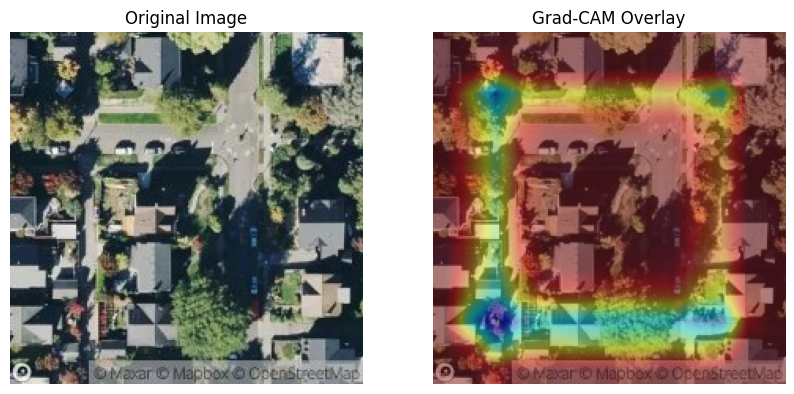

In [ ]:
show_cam("/content/train_images/450_z17.png", cam)

## Approach 3

In [ ]:
import os
import cv2
import torch
import timm
import numpy as np
import pandas as pd

import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm import tqdm


In [ ]:
class EnhancedConvNeXtExtractor(nn.Module):
    def __init__(self, model_name="convnext_tiny", pretrained=True):
        super().__init__()

        self.backbone = timm.create_model(
            model_name,
            pretrained=pretrained,
            features_only=True,
            out_indices=(2, 3)   # stage-2 and stage-3
        )

        self.mid_pool = nn.AdaptiveAvgPool2d(1)   # 384
        self.deep_pool = nn.AdaptiveAvgPool2d(1)  # 768

        self.fusion = nn.Sequential(
            nn.Linear(384 + 768, 768),
            nn.LayerNorm(768),
            nn.GELU()
        )

    def forward(self, x):
        feats = self.backbone(x)

        f2 = torch.flatten(self.mid_pool(feats[0]), 1)
        f3 = torch.flatten(self.deep_pool(feats[1]), 1)

        combined = torch.cat([f2, f3], dim=1)
        return self.fusion(combined)  # (B, 768)


In [ ]:
class Zoom17Dataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform

        self.image_files = sorted([
            f for f in os.listdir(image_dir)
            if f.endswith("_z17.png")
        ])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        fname = self.image_files[idx]
        img_path = os.path.join(self.image_dir, fname)

        img = cv2.imread(img_path)
        if img is None:
            raise FileNotFoundError(img_path)

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if self.transform:
            img = self.transform(img)

        return img, fname   # return filename for alignment


In [ ]:
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


In [ ]:
dataset = Zoom17Dataset(
    image_dir="/content/drive/MyDrive/train_images",
    transform=transform
)

loader = DataLoader(
    dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,   # IMPORTANT for Colab
    pin_memory=True
)


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model = EnhancedConvNeXtExtractor(pretrained=True).to(device)
model.eval()

embeddings = []
filenames = []

with torch.no_grad():
    for imgs, fnames in tqdm(loader, desc="Extracting embeddings"):
        imgs = imgs.to(device)
        feats = model(imgs)              # (B, 768)
        embeddings.append(feats.cpu().numpy())
        filenames.extend(fnames)

embeddings = np.vstack(embeddings)       # (N, 768)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

Extracting embeddings: 100%|██████████| 507/507 [1:55:59<00:00, 13.73s/it]


In [ ]:
np.save("convnext_enhanced_z17_embeddings.npy", embeddings)

In [ ]:
df_embed = pd.DataFrame(embeddings)
df_embed.insert(0, "image", filenames)

df_embed.to_csv("convnext_enhanced_z17_embeddings.csv", index=False)


#### Gradcam

In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, inp, out):
            self.activations = out

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_full_backward_hook(backward_hook)

    def generate(self, x):
        self.model.zero_grad()

        feats = self.model(x)            # (B, 768)
        score = feats.mean()             # scalar proxy
        score.backward()

        grads = self.gradients
        acts = self.activations

        weights = grads.mean(dim=(2, 3), keepdim=True)
        cam = (weights * acts).sum(dim=1)

        cam = torch.relu(cam)
        cam = cam / (cam.max() + 1e-8)

        return cam.detach().cpu()


In [ ]:
for i, m in enumerate(model.backbone.children()):
    print(i, "→", m.__class__.__name__)


0 → Conv2d
1 → LayerNorm2d
2 → ConvNeXtStage
3 → ConvNeXtStage
4 → ConvNeXtStage
5 → ConvNeXtStage


In [ ]:
# Get stages safely
stages = list(model.backbone.children())

# Choose layer
#target_layer = stages[-1]   # deep
target_layer = stages[-2] # mid-level

print("Using target layer:", target_layer)


Using target layer: ConvNeXtStage(
  (downsample): Sequential(
    (0): LayerNorm2d((192,), eps=1e-06, elementwise_affine=True)
    (1): Conv2d(192, 384, kernel_size=(2, 2), stride=(2, 2))
  )
  (blocks): Sequential(
    (0): ConvNeXtBlock(
      (conv_dw): Conv2d(384, 384, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=384)
      (norm): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU()
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity()
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop2): Dropout(p=0.0, inplace=False)
      )
      (shortcut): Identity()
      (drop_path): Identity()
    )
    (1): ConvNeXtBlock(
      (conv_dw): Conv2d(384, 384, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=384)
      (norm): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): 

In [ ]:
def show_cam(img, cam):
    """
    img: PIL.Image OR torch.Tensor (3,H,W) OR numpy (H,W,3)
    cam: torch.Tensor or numpy (1,H,W)
    """

    # -------- Convert image to numpy --------
    if isinstance(img, Image.Image):  # PIL
        img = np.array(img)

    elif torch.is_tensor(img):  # Tensor
        img = img.detach().cpu().permute(1, 2, 0).numpy()
        img = (img - img.min()) / (img.max() - img.min() + 1e-8)
        img = np.uint8(255 * img)

    elif isinstance(img, np.ndarray):
        if img.dtype != np.uint8:
            img = (img - img.min()) / (img.max() - img.min() + 1e-8)
            img = np.uint8(255 * img)

    else:
        raise TypeError(f"Unsupported image type: {type(img)}")

    # -------- CAM --------
    if torch.is_tensor(cam):
        cam = cam[0].detach().cpu().numpy()

    cam = cv2.resize(cam, (img.shape[1], img.shape[0]))
    cam = np.uint8(255 * cam)
    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)

    # -------- Overlay --------
    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # -------- Plot side by side --------
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


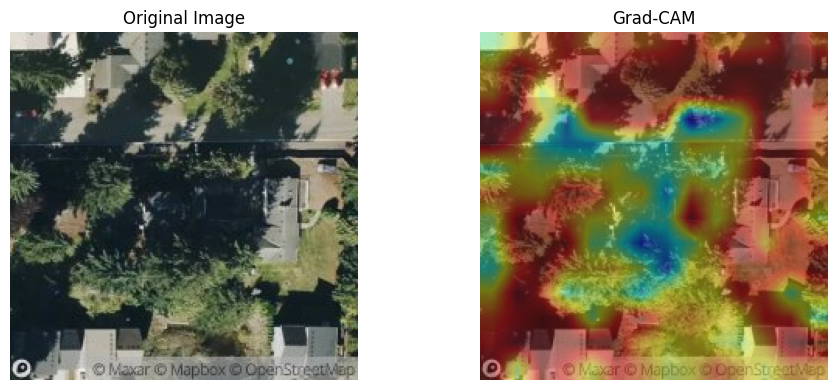

In [ ]:
from matplotlib import pyplot as plt

img, img_t = load_image("/content/drive/MyDrive/train_images/0_z17.png")
img_t = img_t.to(device)

# img     → PIL image (for visualization)
# img_t   → tensor from transforms

if img_t.dim() == 3:
    img_t = img_t.unsqueeze(0)

img_t = img_t.to(device)

gradcam = GradCAM(model, target_layer)
cam = gradcam.generate(img_t)

cam = gradcam.generate(img_t)
show_cam(img, cam)


In [ ]:
df = pd.read_csv('train.csv')
df = df[['id', 'price']]
df["row_number"] = df.index

--- Plotting Most Expensive Houses ---
Row: 4962 | Price: 7700000


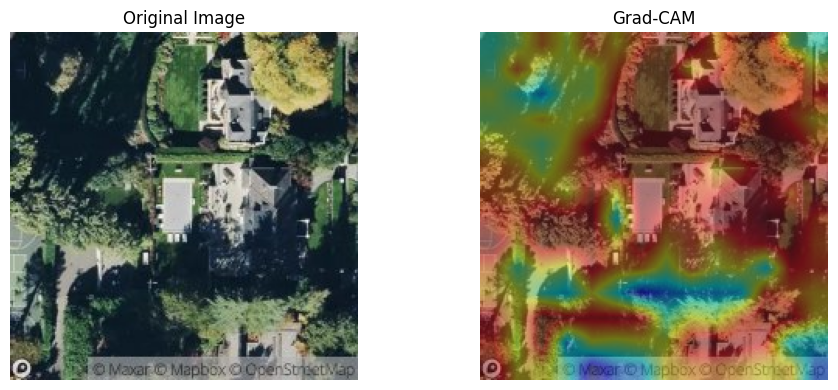

Row: 1499 | Price: 7062500


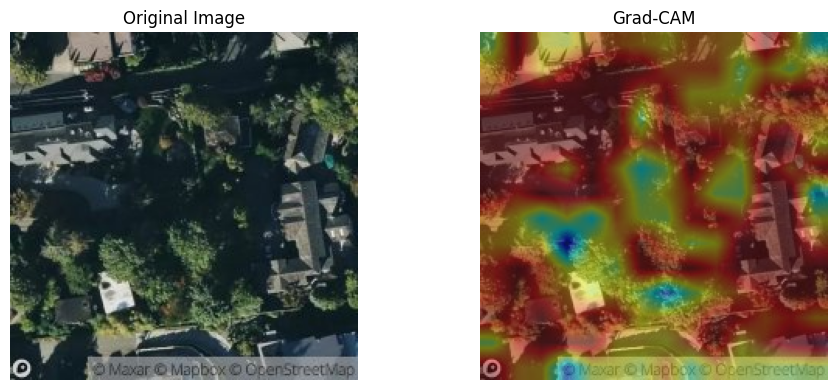

Row: 2115 | Price: 6885000


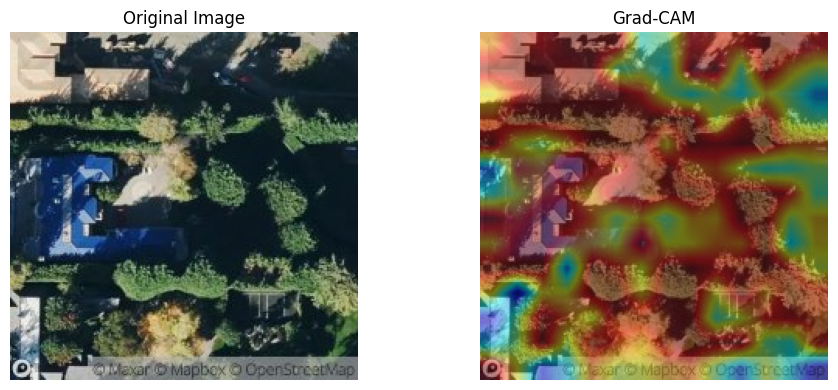

Row: 9264 | Price: 5110800


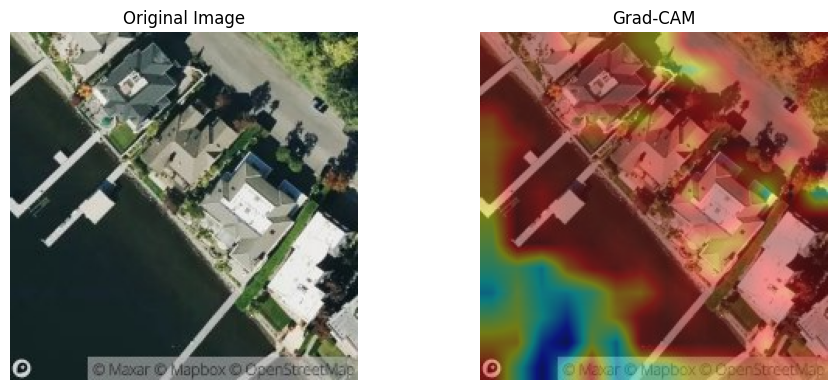

Row: 10412 | Price: 4668000


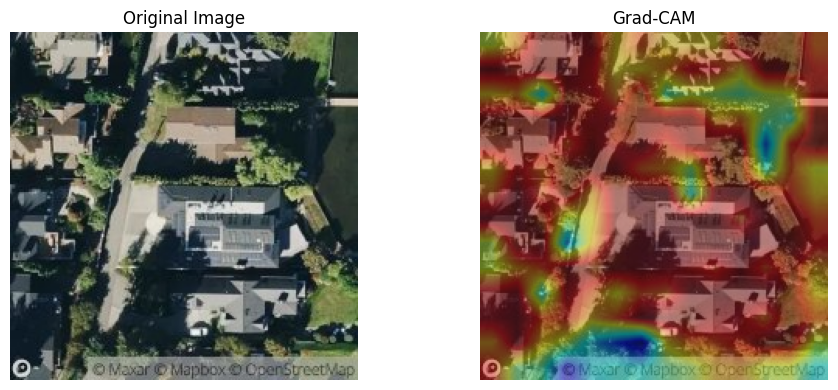

--- Plotting Cheapest Houses ---
Row: 3656 | Price: 75000


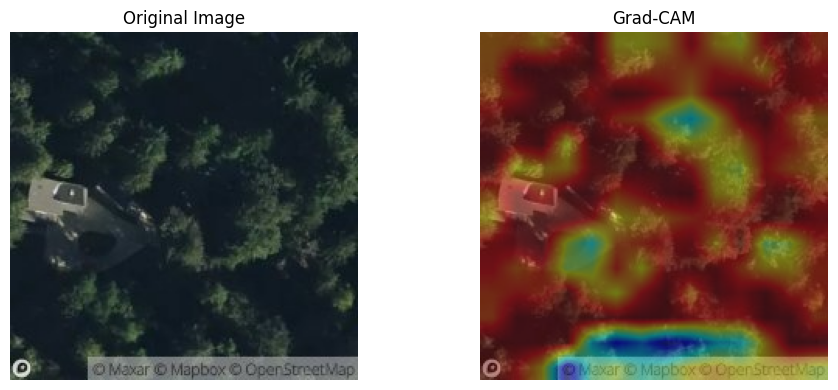

Row: 3789 | Price: 80000


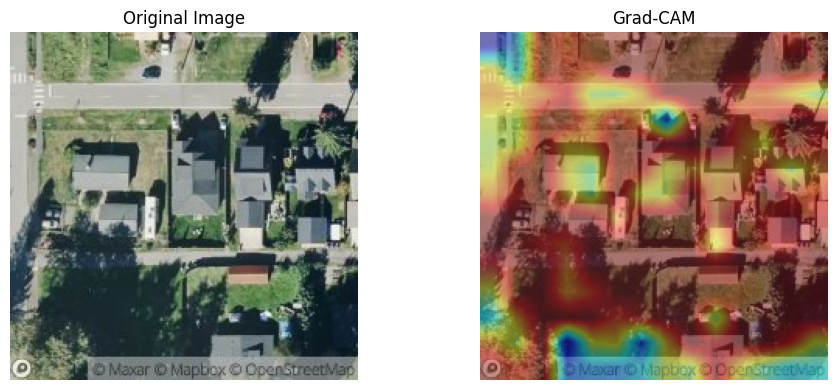

Row: 16074 | Price: 81000


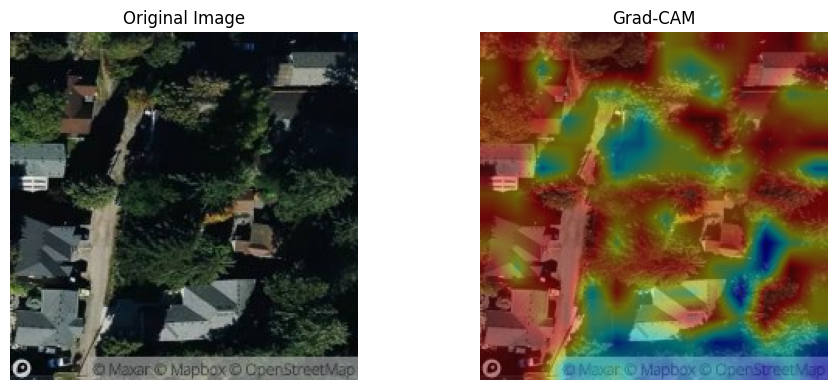

Row: 10552 | Price: 82000


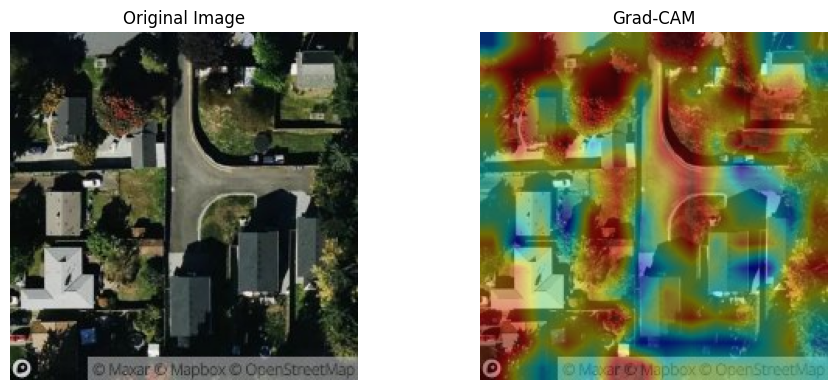

Row: 10246 | Price: 84000


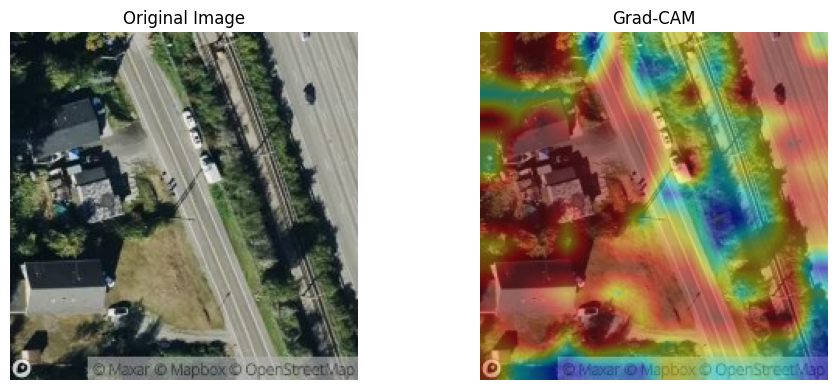

In [ ]:
import torch
from matplotlib import pyplot as plt

# 1. Identify the top 5 most expensive and top 5 cheapest houses
top_5_expensive = df.nlargest(5, 'price')
top_5_cheapest = df.nsmallest(5, 'price')

# Combine them into a single list/dataframe for processing
target_houses = [
    ("Most Expensive", top_5_expensive),
    ("Cheapest", top_5_cheapest)
]

# 2. Initialize GradCAM
gradcam = GradCAM(model, target_layer)

# 3. Iterate and plot
for category, houses in target_houses:
    print(f"--- Plotting {category} Houses ---")

    for _, row in houses.iterrows():
        # Construct the path using row_number column
        row_id = int(row['row_number'])
        img_path = f"/content/drive/MyDrive/train_images/{row_id}_z17.png"

        try:
            # Load and preprocess image
            img, img_t = load_image(img_path)
            img_t = img_t.to(device)

            if img_t.dim() == 3:
                img_t = img_t.unsqueeze(0)

            # Generate GradCAM activation map
            cam = gradcam.generate(img_t)

            # Display results
            print(f"Row: {row_id} | Price: {row['price']}")
            show_cam(img, cam)
            plt.show()

        except FileNotFoundError:
            print(f"Error: Image not found at {img_path}")
        except Exception as e:
            print(f"An error occurred for row {row_id}: {e}")